# Install all necessary packages

In [126]:
!pip install keras

In [127]:
!pip install matplotlib

In [128]:
!pip install bing-image-downloader

In [129]:
!pip install tensorflow

In [130]:
## import random stuff 

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing import image

import os
import numpy as np
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing import image

split the data into validation and training set

In [4]:
img_height = 64
img_width = 64
batch_size = 3
path = "/home/gaia/my_project_dir/ml/main/data"

#initialize
train_datagen = ImageDataGenerator(rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2) # set validation split

train_generator = train_datagen.flow_from_directory(
    path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training') # set as training data

validation_generator = train_datagen.flow_from_directory(
    path, # same directory as training data
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation', shuffle = False) # set as validation data


Found 846 images belonging to 2 classes.
Found 211 images belonging to 2 classes.


In [5]:
true_classes = train_generator.classes
class_labels = list(validation_generator.class_indices.keys())   
print(true_classes, class_labels)
#confusion matrix
#test

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

function to compile and train the model

In [8]:
def create_model(model):
    #compile the model
    model.compile(optimizer = 'adam',
             loss = 'binary_crossentropy', 
         metrics =['accuracy'] )
    #train the model
    model_fit = model.fit(train_generator,
                     epochs = 50,
                     validation_data = validation_generator)
    return model_fit
    

In [9]:
## Define the model architecture

3 models

In [10]:
#maybe model 1
model = tf.keras.models.Sequential([# The first convolution
                                    tf.keras.layers.Conv2D(16, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The second convolution
                                    , tf.keras.layers.Conv2D(32, (3,3),activation='relu'
                                    ,input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The third convolution
                                    , tf.keras.layers.Conv2D(64, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    # Flatten the results
                                    , tf.keras.layers.Flatten()
                                    , tf.keras.layers.Dense(512,activation = 'relu')
                                    #1 output neuron. 0 for the class 'bloodhound' 1 for the class 'terrier'
                                    , tf.keras.layers.Dense(1, activation = 'sigmoid')])

In [11]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 16)        448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 31, 31, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 29, 29, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 12, 12, 64)        18496     
_________________________________________________________________
flatten (Flatten)            (None, 9216)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               4

In [12]:
model2 = tf.keras.models.Sequential([# The first convolution
                                    tf.keras.layers.Conv2D(16, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The second convolution
                                    , tf.keras.layers.Conv2D(32, (3,3),activation='relu'
                                    ,input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The third convolution
                                    , tf.keras.layers.Conv2D(64, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    # The fourth convolution
                                    , tf.keras.layers.Conv2D(128, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # Flatten the results
                                    , tf.keras.layers.Flatten()
                                    , tf.keras.layers.Dense(512,activation = 'relu')
                                    #1 output neuron. 0 for the class 'bloodhound' 1 for the class 'terrier'
                                    , tf.keras.layers.Dense(1, activation = 'sigmoid')])

In [13]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 62, 62, 16)        448       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 31, 31, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 29, 29, 32)        4640      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 12, 12, 64)        18496     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 10, 10, 128)       73856     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 5, 5, 128)        

In [14]:
model3 = tf.keras.models.Sequential([# The first convolution
                                    tf.keras.layers.Conv2D(16, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The second convolution
                                    , tf.keras.layers.Conv2D(32, (3,3),activation='relu'
                                    ,input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The third convolution
                                    , tf.keras.layers.Conv2D(64, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    # The fourth convolution
                                    , tf.keras.layers.Conv2D(128, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # The fifth convolution
                                    , tf.keras.layers.Conv2D(256, (3,3),activation='relu'
                                    , input_shape = (img_height, img_width, batch_size))
                                    , tf.keras.layers.MaxPool2D(2,2)
                                    # Flatten the results
                                    , tf.keras.layers.Flatten()
                                    , tf.keras.layers.Dense(512,activation = 'relu')
                                    #1 output neuron. 0 for the class 'bloodhound' 1 for the class 'terrier'
                                    , tf.keras.layers.Dense(1, activation = 'sigmoid')])

In [15]:
model3.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 62, 62, 16)        448       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 31, 31, 16)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 29, 29, 32)        4640      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 12, 12, 64)        18496     
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 10, 10, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 5, 5, 128)        

In [16]:
model_fit = create_model(model)

Epoch 1/50
282/282 [==============================] - 6s 20ms/step - loss: 0.4446 - accuracy: 0.7896 - val_loss: 0.3402 - val_accuracy: 0.8863
Epoch 2/50
282/282 [==============================] - 6s 20ms/step - loss: 0.2758 - accuracy: 0.9007 - val_loss: 0.2260 - val_accuracy: 0.9336
Epoch 3/50
282/282 [==============================] - 6s 20ms/step - loss: 0.2474 - accuracy: 0.9054 - val_loss: 0.2008 - val_accuracy: 0.9147
Epoch 4/50
282/282 [==============================] - 6s 20ms/step - loss: 0.2604 - accuracy: 0.9054 - val_loss: 0.2721 - val_accuracy: 0.9005
Epoch 5/50
282/282 [==============================] - 7s 23ms/step - loss: 0.2301 - accuracy: 0.9066 - val_loss: 0.1944 - val_accuracy: 0.9479
Epoch 6/50
282/282 [==============================] - 7s 25ms/step - loss: 0.2272 - accuracy: 0.9161 - val_loss: 0.1945 - val_accuracy: 0.9242
Epoch 7/50
282/282 [==============================] - 7s 23ms/step - loss: 0.2093 - accuracy: 0.9125 - val_loss: 0.1547 - val_accuracy: 0.9479

In [17]:
model_fit2 = create_model(model2)

Epoch 1/50
282/282 [==============================] - 4s 16ms/step - loss: 0.4217 - accuracy: 0.8440 - val_loss: 0.2444 - val_accuracy: 0.9194
Epoch 2/50
282/282 [==============================] - 4s 16ms/step - loss: 0.2824 - accuracy: 0.9066 - val_loss: 0.2506 - val_accuracy: 0.9052
Epoch 3/50
282/282 [==============================] - 4s 15ms/step - loss: 0.2533 - accuracy: 0.9090 - val_loss: 0.3141 - val_accuracy: 0.8768
Epoch 4/50
282/282 [==============================] - 4s 15ms/step - loss: 0.2516 - accuracy: 0.9054 - val_loss: 0.2446 - val_accuracy: 0.9052
Epoch 5/50
282/282 [==============================] - 4s 15ms/step - loss: 0.2389 - accuracy: 0.9113 - val_loss: 0.1984 - val_accuracy: 0.9242
Epoch 6/50
282/282 [==============================] - 4s 15ms/step - loss: 0.2264 - accuracy: 0.9125 - val_loss: 0.1967 - val_accuracy: 0.9242
Epoch 7/50
282/282 [==============================] - 4s 15ms/step - loss: 0.2179 - accuracy: 0.9267 - val_loss: 0.1827 - val_accuracy: 0.9289

In [18]:
model_fit3 = create_model(model3)

Epoch 1/50
282/282 [==============================] - 4s 14ms/step - loss: 0.6030 - accuracy: 0.6667 - val_loss: 0.4604 - val_accuracy: 0.8104
Epoch 2/50
282/282 [==============================] - 4s 14ms/step - loss: 0.3121 - accuracy: 0.8877 - val_loss: 0.2954 - val_accuracy: 0.8578
Epoch 3/50
282/282 [==============================] - 4s 13ms/step - loss: 0.2869 - accuracy: 0.8924 - val_loss: 0.2914 - val_accuracy: 0.8910
Epoch 4/50
282/282 [==============================] - 4s 13ms/step - loss: 0.3181 - accuracy: 0.8842 - val_loss: 0.5901 - val_accuracy: 0.7962
Epoch 5/50
282/282 [==============================] - 4s 14ms/step - loss: 0.2731 - accuracy: 0.9090 - val_loss: 0.3161 - val_accuracy: 0.9147
Epoch 6/50
282/282 [==============================] - 4s 14ms/step - loss: 0.2778 - accuracy: 0.9113 - val_loss: 0.2490 - val_accuracy: 0.8957
Epoch 7/50
282/282 [==============================] - 4s 14ms/step - loss: 0.2869 - accuracy: 0.8995 - val_loss: 0.2650 - val_accuracy: 0.9147

plot the three models accuracy 

In [19]:
#function to plot the model accuracy
def model_accuracy(model, model_fit):
    history = model_fit
    plt.plot(history.history['accuracy'], label='accuracy')
    plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim([0.5, 1])
    plt.legend(loc='lower right')
    test_loss, test_acc = model.evaluate(train_generator, verbose=2)
    test_loss, test_acc = model.evaluate(validation_generator, verbose=2)
    
#     predictions = model.predict_classes()
#     predictions = predictions.reshape(1,-1)[0]
#     print(classification_report(y_val, predictions, target_names = ['bloodhound (Class 0)','westie (Class 1)']))

In [20]:
#model 1

model 1
282/282 - 2s - loss: 0.0113 - accuracy: 0.9976
71/71 - 1s - loss: 0.2720 - accuracy: 0.9479


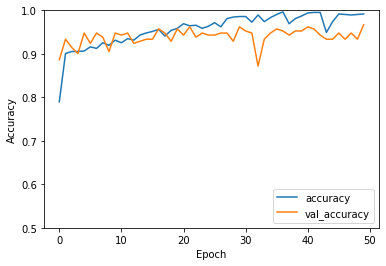

In [21]:
print('model 1')
model_accuracy(model, model_fit)


model 2
282/282 - 2s - loss: 0.1029 - accuracy: 0.9610
71/71 - 1s - loss: 0.2449 - accuracy: 0.9431


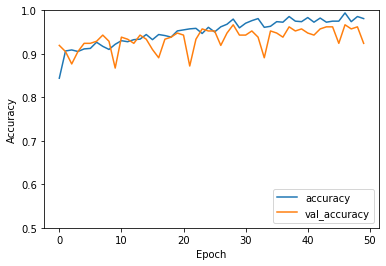

In [22]:
print('model 2')
model_accuracy(model2, model_fit2)


model 3
282/282 - 2s - loss: 0.0406 - accuracy: 0.9835
71/71 - 1s - loss: 0.3211 - accuracy: 0.9384


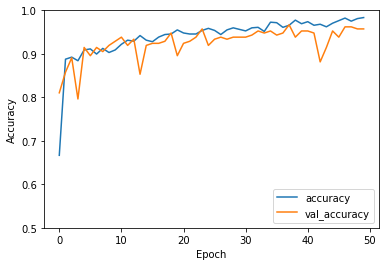

In [23]:
print('model 3')
model_accuracy(model3, model_fit3)

calculate ROC curve

In [30]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn import metrics

In [31]:
#I think here there is a proble with the shuffle

In [32]:
def ROC_Plot(model):
    #reset validation set
#     STEP_SIZE_TEST=validation_generator.n//validation_generator.batch_size
    validation_generator.reset()
    preds = model.predict(validation_generator)
    #plot ROC curve
    fpr, tpr, _ = roc_curve(validation_generator.classes, preds)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
    lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()
    #Get ground-truth classes and class-labels 
    true_classes = validation_generator.classes
    class_labels = list(validation_generator.class_indices.keys())  
    #convert into integers
    predictions_integer = preds.astype(int)
    #convert into list
    predicted_class_list = predictions_integer.tolist()
    #flatten list
    predicted_class = [item for sublist in predicted_class_list for item in sublist]
    
    # Use scikit-learn to get statistics
    report = metrics.classification_report(true_classes, predicted_class, target_names=class_labels)
    print(report)    
    print(len(true_classes))
    print(len(predicted_class))
    

model 1


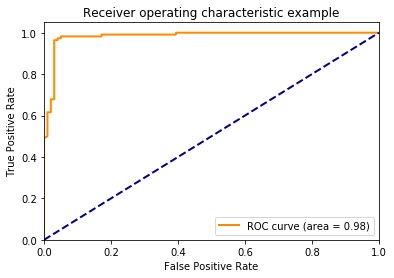

              precision    recall  f1-score   support

  bloodhound       0.62      1.00      0.77        99
      westie       1.00      0.46      0.63       112

    accuracy                           0.72       211
   macro avg       0.81      0.73      0.70       211
weighted avg       0.82      0.72      0.70       211

211
211
model 2


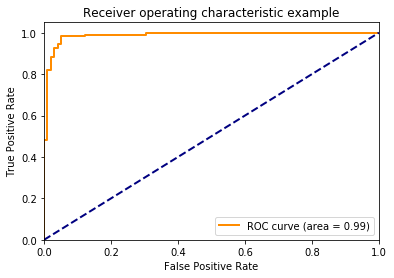

              precision    recall  f1-score   support

  bloodhound       0.56      1.00      0.71        99
      westie       1.00      0.29      0.46       112

    accuracy                           0.63       211
   macro avg       0.78      0.65      0.58       211
weighted avg       0.79      0.63      0.58       211

211
211
model 3


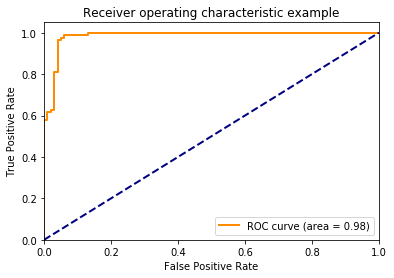

              precision    recall  f1-score   support

  bloodhound       0.56      1.00      0.72        99
      westie       1.00      0.31      0.48       112

    accuracy                           0.64       211
   macro avg       0.78      0.66      0.60       211
weighted avg       0.79      0.64      0.59       211

211
211


In [33]:
print('model 1')
ROC_Plot(model)
print('model 2')
ROC_Plot(model2)
print('model 3')
ROC_Plot(model3)

In [ ]:
#test performance of model1

In [162]:
import numpy
from sklearn import metrics
test_data_path = '/home/gaia/my_project_dir/ml/main/test'
test_generator = ImageDataGenerator()
test_data_generator = test_generator.flow_from_directory(
    test_data_path, # Put your path here
     target_size=(img_width, img_height),
    batch_size=batch_size,
    shuffle=False)
predictions = model.predict(test_data_generator)
#convert into integers
predictions_integer = predictions.astype(int)
#convert into list
predicted_class_list = predictions_integer.tolist()
#flatten list
predicted_class = [item for sublist in predicted_class_list for item in sublist]
#Get ground-truth classes and class-labels
true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())   
# Use scikit-learn to get statistics
report = metrics.classification_report(true_classes, predicted_class, target_names=class_labels)
print(report)    

Found 100 images belonging to 2 classes.
              precision    recall  f1-score   support

  bloodhound       0.89      0.98      0.93        50
      westie       0.98      0.88      0.93        50

    accuracy                           0.93       100
   macro avg       0.93      0.93      0.93       100
weighted avg       0.93      0.93      0.93       100



In [ ]:
#ignore everything here

In [ ]:
dir_path = '/home/gaia/my_project_dir/ml/main/test'
white_terrier = dir_path+'/white_terrier'
bloodhound = dir_path+'/bloodhound'
predictions = []
for i in os.listdir(white_terrier):
    img = image.load_img(white_terrier+'//'+i)#, target_size = (64,64))
    plt.imshow(img)
    plt.show()
    img_pred = image.load_img(white_terrier+'//'+i, target_size = (64,64))
    img_pred = image.img_to_array(img_pred)
    img_pred = np.expand_dims(img_pred, axis = 0)
    val = model.predict(img_pred)
    images = np.vstack([img_pred])
    val = model.predict(images)

    if val[0] <0.5:
        print('bloodhound')
        predictions.append(0)
    else:
        print('terrier')
        predictions.append(1)

for i in os.listdir(bloodhound):
    img = image.load_img(bloodhound+'//'+i)#, target_size = (64,64))
    plt.imshow(img)
    plt.show()
    img_pred = image.load_img(bloodhound+'//'+i, target_size = (64,64))
    img_pred = image.img_to_array(img_pred)
    img_pred = np.expand_dims(img_pred, axis = 0)
    val = model.predict(img_pred)
    images = np.vstack([img_pred])
    val = model.predict(images)

    if val[0] <0.5:
        print('bloodhound')
        predictions.append(0)
    else:
        print('terrier')
        predictions.append(1)
print(predictions)

report = metrics.classification_report(true_classes, predictions, target_names=class_labels)
print(report) 




Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.


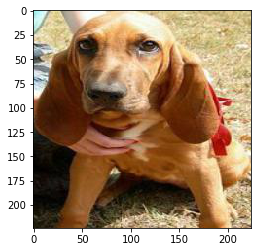

basset


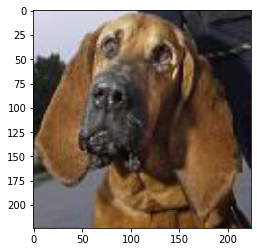

basset


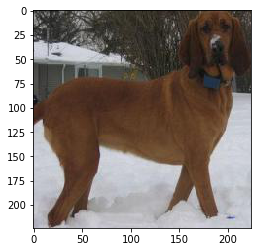

basset


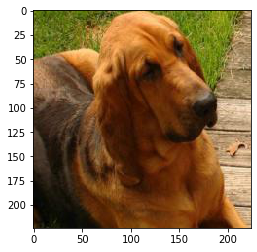

basset


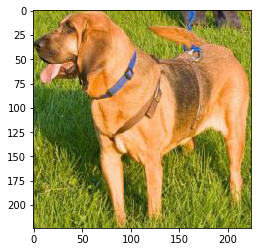

basset


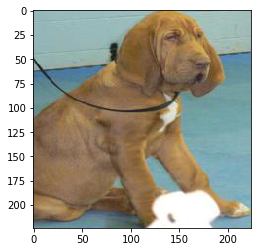

basset


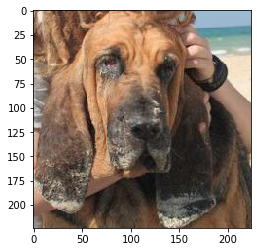

terrier


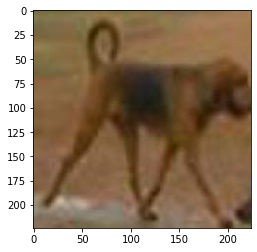

basset


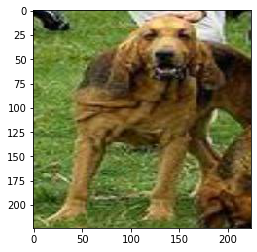

basset


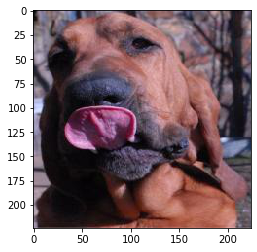

terrier


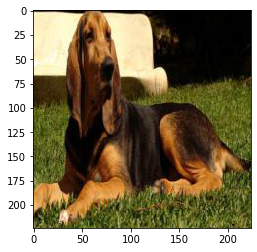

basset


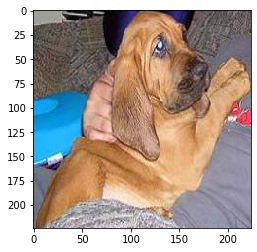

basset


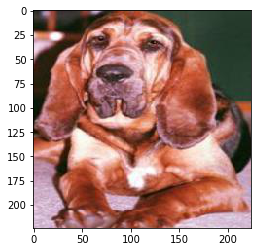

basset


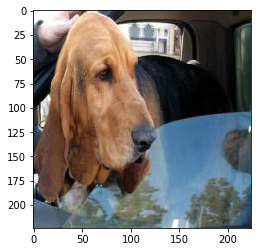

basset


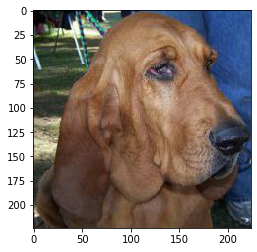

basset


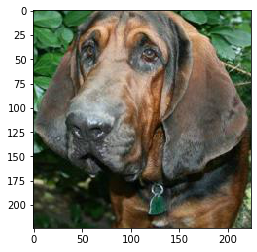

basset


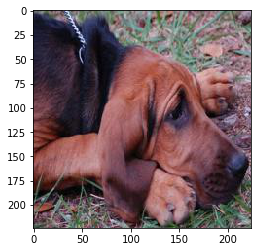

basset


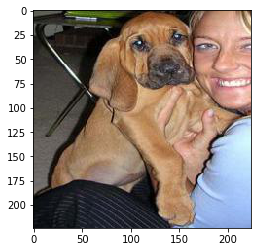

basset


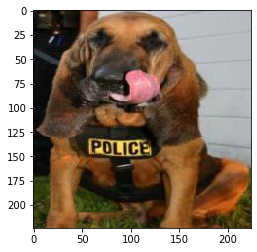

basset


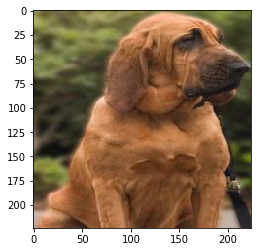

basset


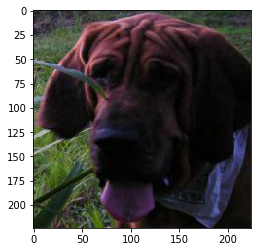

basset


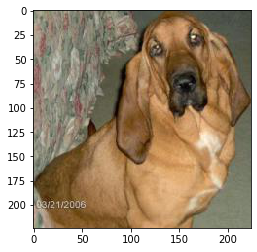

basset


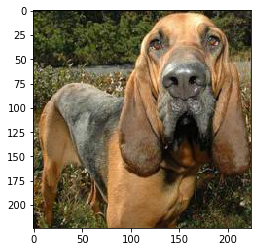

basset


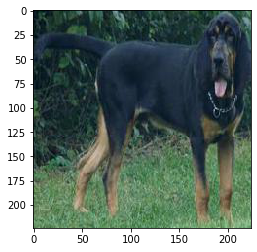

terrier


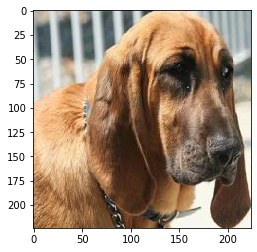

basset


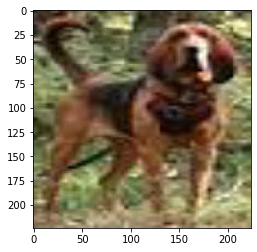

basset


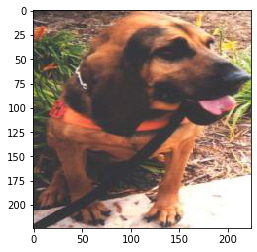

basset


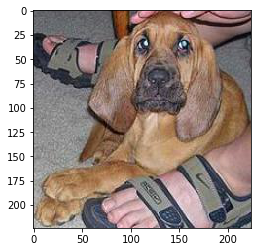

terrier


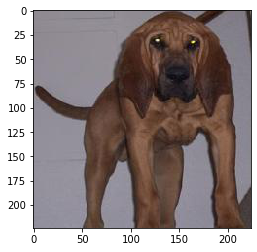

basset


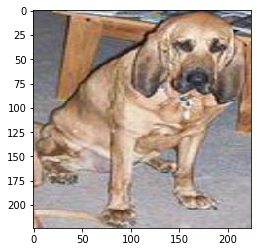

basset


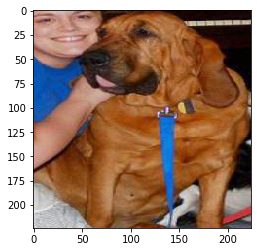

basset


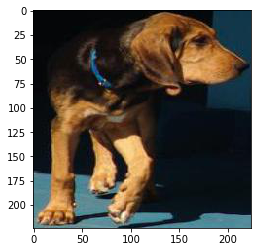

basset


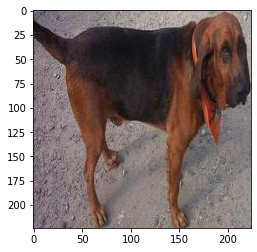

basset


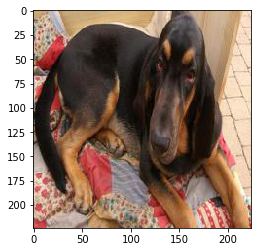

basset


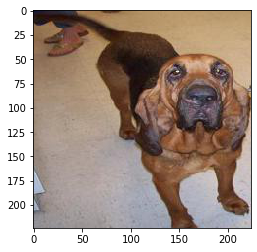

basset


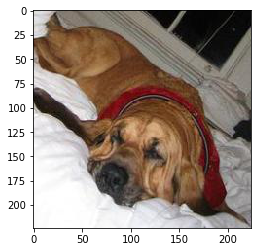

basset


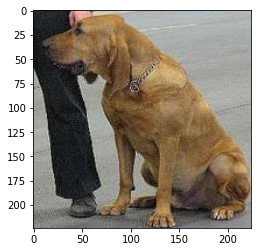

basset


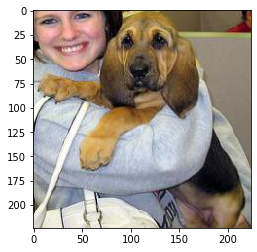

basset


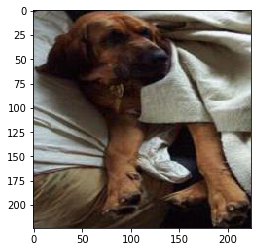

basset


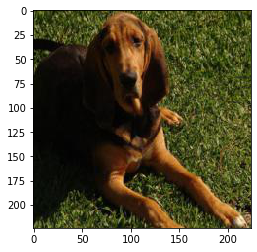

basset


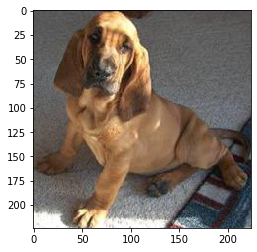

basset


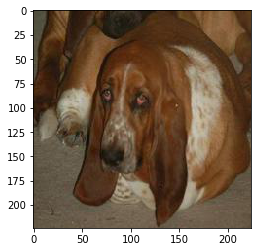

basset


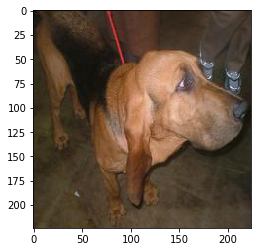

basset


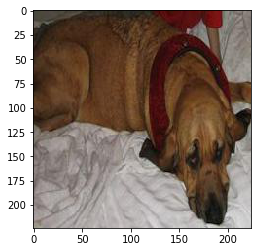

basset


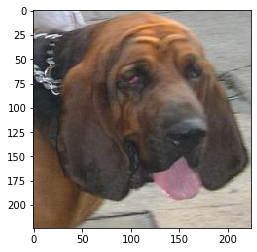

basset


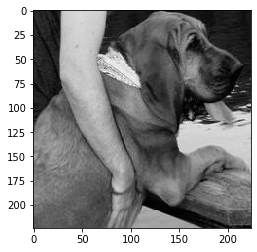

terrier


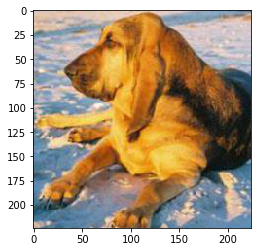

basset


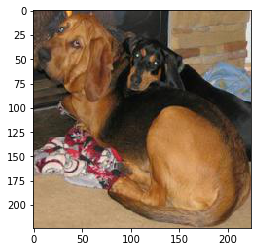

basset


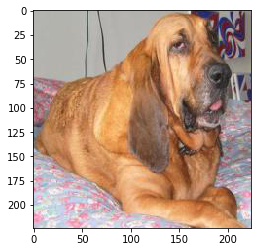

basset


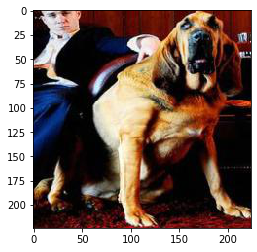

basset


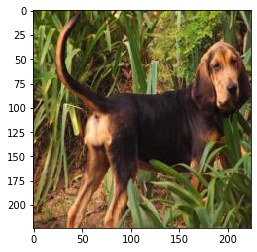

basset


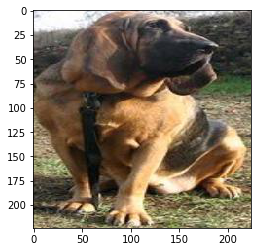

basset


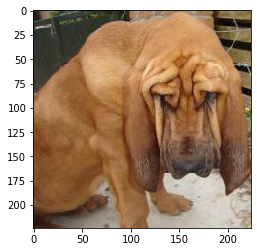

basset


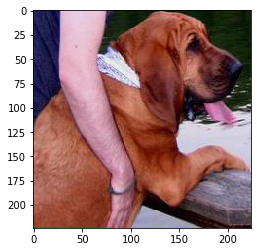

basset


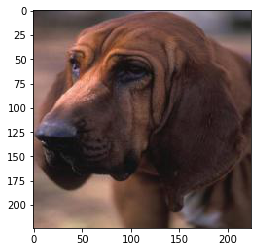

basset


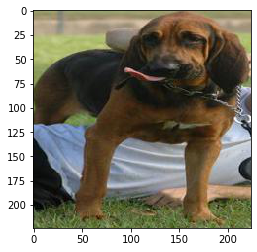

basset


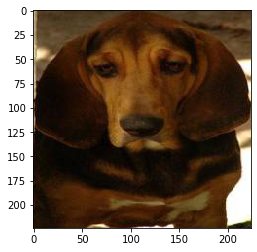

basset


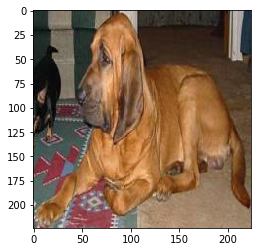

basset


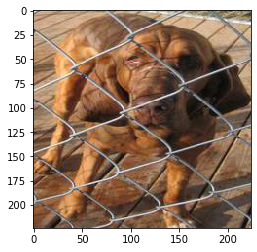

basset


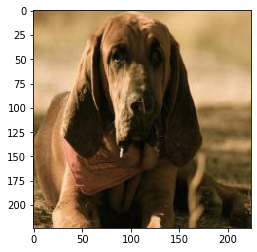

basset


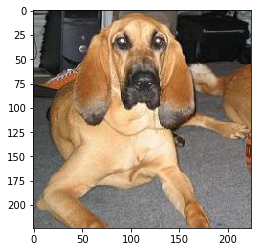

terrier


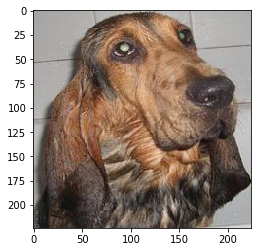

basset


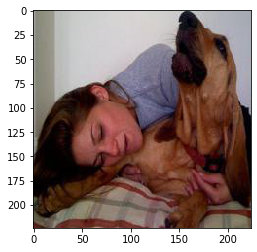

basset


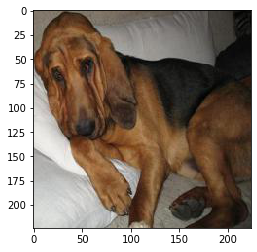

basset


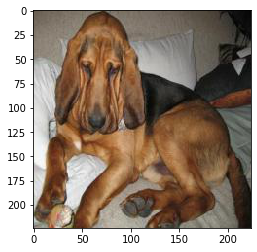

basset


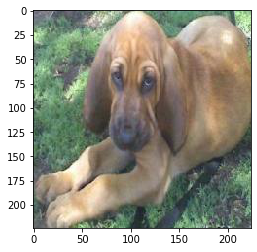

terrier


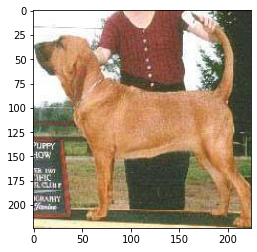

basset


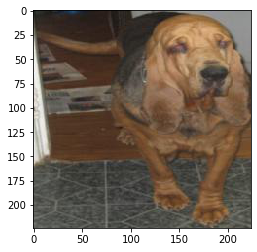

basset


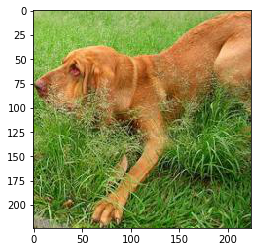

basset


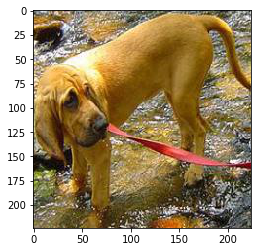

basset


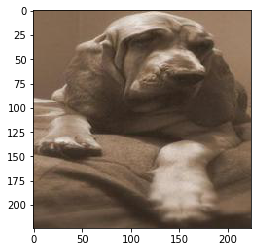

basset


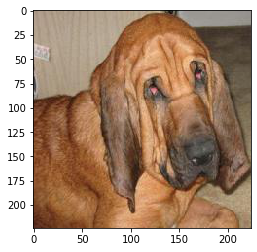

basset


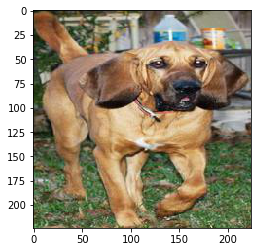

basset


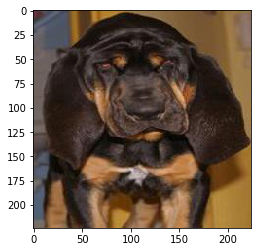

basset


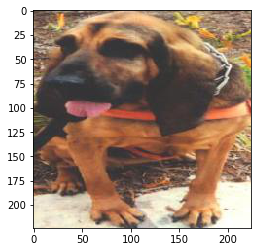

basset


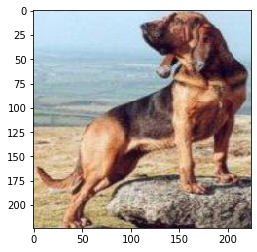

terrier


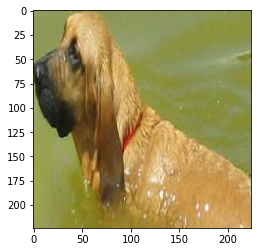

basset


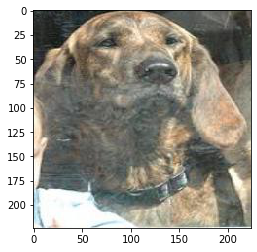

terrier


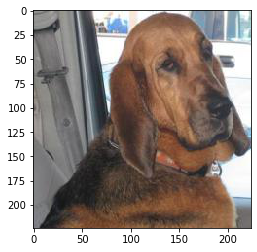

basset


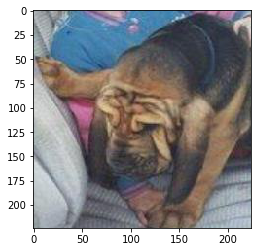

basset


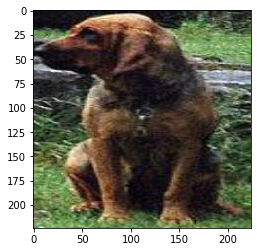

basset


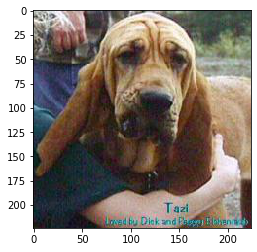

basset


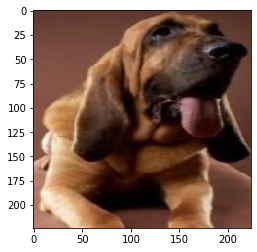

basset


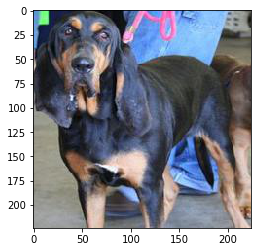

terrier


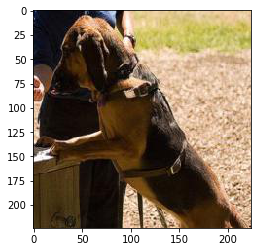

basset


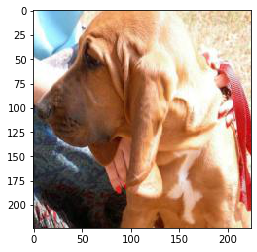

basset


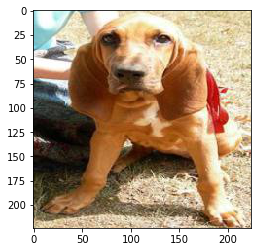

basset


In [66]:
dir_path = '/home/gaia/my_project_dir/ml/main/test2/bloodhound'
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+'//'+i)#, target_size = (64,64))
    plt.imshow(img)
    plt.show()
    img_pred = image.load_img(dir_path+'//'+i, target_size = (64,64))
    img_pred = image.img_to_array(img_pred)
    img_pred = np.expand_dims(img_pred, axis = 0)
    val = model.predict(img_pred)
    images = np.vstack([img_pred])
    val = model.predict(images)
    if val[0] < 0.5:
        print('basset')
    else:
        print('terrier')

Found existing installation: imagecleaner 0.4.4
Uninstalling imagecleaner-0.4.4:
  Would remove:
    /home/gaia/anaconda3/bin/image-cleaner
    /home/gaia/anaconda3/lib/python3.7/site-packages/imagecleaner-0.4.4.dist-info/*
    /home/gaia/anaconda3/lib/python3.7/site-packages/imagecleaner/*
Proceed (y/n)? ^C
ERROR: Operation cancelled by user
